In [313]:
#Importing Required libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sb
import plotly.express as px

#To ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [314]:
#Reading the dataset onto python and printing limited rows to get an understanding
loan_base = pd.read_csv("loan.csv")
loan_base.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [315]:
# Check Number of Rows and Columns
loan_base.shape

(39717, 111)

### Data quality Checks

In [316]:
#DQC1 Duplication checks for Unique Identifier
a = loan_base["id"].duplicated().sum()
if a == 0:
    print("No Duplicates in ID column")
else:
    print(a, "duplicates found")
    
#Fidning - There were no duplicates found in the column

No Duplicates in ID column


In [317]:
#DQC2 Check empty columns (as visibly seen in excel)
if loan_base.isna().all().sum()>0:
    loan_cleaned1 = loan_base.dropna(axis = 1, how = 'all')
    print(loan_base.isna().all().sum(),"columns deleted")
else:
    print("No null columns")
print(loan_cleaned1.shape)

54 columns deleted
(39717, 57)


In [318]:
#DQC3 Check columns with high null values (> 25% as these would skew the findings from the data)
loan_cleaned1.isna().sum()
loan_cleaned2 = loan_cleaned1.drop(["desc","mths_since_last_delinq","mths_since_last_record","next_pymnt_d"], axis = 1)
loan_cleaned2.shape

(39717, 53)

In [319]:
#DQC4 Check and remove columns having a single value as these would not add any value to the analysis
loan_cleaned2.nunique()
loan_cleaned3 = loan_cleaned2.drop(["pymnt_plan","initial_list_status","collections_12_mths_ex_med","policy_code","application_type","acc_now_delinq","chargeoff_within_12_mths","tax_liens","delinq_amnt"], axis = 1)
loan_cleaned3.shape

(39717, 44)

In [320]:
#Check column data types
loan_cleaned3.dtypes
#Change data types of interest rate and Utilization rate from object to float
loan_cleaned3['int_rate'] = loan_cleaned3['int_rate'].str.rstrip('%')
loan_cleaned3['revol_util'] = loan_cleaned3['revol_util'].str.rstrip('%')
loan_cleaned3['int_rate'] = loan_cleaned3['int_rate'].astype('float64')
loan_cleaned3['revol_util'] = loan_cleaned3['revol_util'].astype('float64')

In [321]:
#DQC5 Treatment of term & emp_length column for converting to numerical values (replace null values with 0, later to be removed from any insight generation study)
# Pick only numeric value from the columns using string regex
loan_cleaned3.isna().sum()
loan_cleaned3.emp_length.fillna('0',inplace=True)
loan_cleaned3['emp_length']=loan_cleaned3.emp_length.str.extract('(\d+)')

loan_cleaned3['term']=loan_cleaned3.term.str.extract('(\d+)')

In [322]:
# Converting Employment Length colum to integer type
loan_cleaned3['emp_length'] = loan_cleaned3['emp_length'].astype('int64')

In [323]:
# Check Term values
loan_cleaned3.term.value_counts()

36    29096
60    10621
Name: term, dtype: int64

### Changing Data Types for date columns and creating derived columns

In [324]:
# Change Data type of Date from Object to datetime format
# Create Year and Month Column from Loan Issue date to be used as categorical variables for trends
loan_cleaned3['issue_d'] = pd.to_datetime(loan_cleaned3['issue_d'], format='%b-%y')
loan_cleaned3['earliest_cr_line'] = pd.to_datetime(loan_cleaned3['earliest_cr_line'], format='%b-%y')
loan_cleaned3['last_pymnt_d'] = pd.to_datetime(loan_cleaned3['last_pymnt_d'], format='%b-%y')
loan_cleaned3['last_credit_pull_d'] = pd.to_datetime(loan_cleaned3['last_credit_pull_d'], format='%b-%y')

loan_cleaned3['issue_year'] = loan_cleaned3['issue_d'].dt.year
loan_cleaned3['issue_month'] = loan_cleaned3['issue_d'].dt.month

loan_cleaned3[['issue_d','earliest_cr_line','issue_year','issue_month']].head()

# 2 New COlumns Issue Year and Issue Month were created

,issue_d,earliest_cr_line,issue_year,issue_month
0,2011-12-01,1985-01-01,2011,12
1,2011-12-01,1999-04-01,2011,12
2,2011-12-01,2001-11-01,2011,12
3,2011-12-01,1996-02-01,2011,12
4,2011-12-01,1996-01-01,2011,12


In [325]:
#Creating Derived columns from Loan Amount, # of open accounts, Annual Income & Interest Rates by creating buckets to be used a categorical variables
loan_cleaned3['bucket_loan_amnt'] = pd.cut(loan_cleaned3['loan_amnt'], [0, 5000, 10000, 15000, 20000, 25000, 30000, 35000], labels=['0-5000', '5000-10000', '10000-15000', '15000-20000', '20000-25000', '25000-30000', '30000 +'])

loan_cleaned3['bucket_int_rate'] = pd.cut(loan_cleaned3['int_rate'], [0, 10, 12.5, 15, 17.5, 20], labels=['0-10', '10-13', '13-15', '15-17', '17 +'])

loan_cleaned3['bucket_open_acc'] = pd.cut(loan_cleaned3['open_acc'], [0, 5, 10, 15, 20, 25], labels=['0-5', '5-10', '10-15', '15-20', '20+'])

loan_cleaned3['bucket_annual_inc'] = pd.cut(loan_cleaned3['annual_inc'], [0, 20000, 40000, 60000, 80000,1000000], labels=['0-20000', '20000-40000', '40000-60000', '60000-80000', '80000 +'])

In [326]:
loan_cleaned3.dtypes

id                                  int64
member_id                           int64
loan_amnt                           int64
funded_amnt                         int64
funded_amnt_inv                   float64
term                               object
int_rate                          float64
installment                       float64
grade                              object
sub_grade                          object
emp_title                          object
emp_length                          int64
home_ownership                     object
annual_inc                        float64
verification_status                object
issue_d                    datetime64[ns]
loan_status                        object
url                                object
purpose                            object
title                              object
zip_code                           object
addr_state                         object
dti                               float64
delinq_2yrs                       

### Outlier identification and treatment

In [327]:
### Understand distribution in key quantitaive columns - Loan Amount
loan_cleaned3.loan_amnt.describe()

count    39717.000000
mean     11219.443815
std       7456.670694
min        500.000000
25%       5500.000000
50%      10000.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64

In [328]:
# Box Plot 
fig1 = px.box(loan_cleaned3, y="loan_amnt", title="Box Plot for Loan Amount distribution")
fig1.update_layout(title_text='Box Plot for Loan Amount distribution', title_x=0.5)
fig1.show()

#Findings - The Range goes upto max of 35k with 25th & 75th percentile being at 5.5k and 15k respectively

In [329]:
### Understand distribution in key quantitaive columns - Annual Income
fig2 = px.box(loan_cleaned3, y="annual_inc")
fig2.update_layout(title_text='Box Plot for Annual Income distribution', title_x=0.5)
fig2.show()

# There are outliers at the upper end, and hence there is a requirement of removing the top percentiles
# The Range goes upto max of 6M with 25th & 75th percentile being at 40k and 82k respectively

In [251]:
#Outlier treatment for Annual Income
loan_cleaned4 = loan_cleaned3[loan_cleaned3["annual_inc"]< loan_cleaned3["annual_inc"].quantile(0.99)]
loan_cleaned4.shape

(39319, 50)

In [330]:
### Understand distribution in key quantitaive columns - Annual Income post Outlier Treatment
fig2 = px.box(loan_cleaned4, y="annual_inc")
fig2.update_layout(title_text='Box Plot for Annual Income distribution', title_x=0.5)
fig2.show()

# The Range goes upto max of 6M with 25th & 75th percentile being at 40k and 81k respectively

In [253]:
### Understand distribution in key quantitaive columns - Payment made
loan_cleaned4.total_pymnt.describe()

count    39319.000000
mean     12051.143533
std       8929.135602
min          0.000000
25%       5561.299424
50%       9830.255586
75%      16429.424275
max      58563.679930
Name: total_pymnt, dtype: float64

In [332]:
### Understand distribution in key quantitaive columns - Total Payment
fig3 = px.box(loan_cleaned4, y="total_pymnt")
fig3.update_layout(title_text='Box Plot for Total payment distribution', title_x=0.5)
fig3.show()

# Finding - Total Payment lies within the range of 0-58k $. 25th and 75th percentile being at 5.5k and 16k respectively. Median lies at ~10k $

### Exploratory Data Analysis

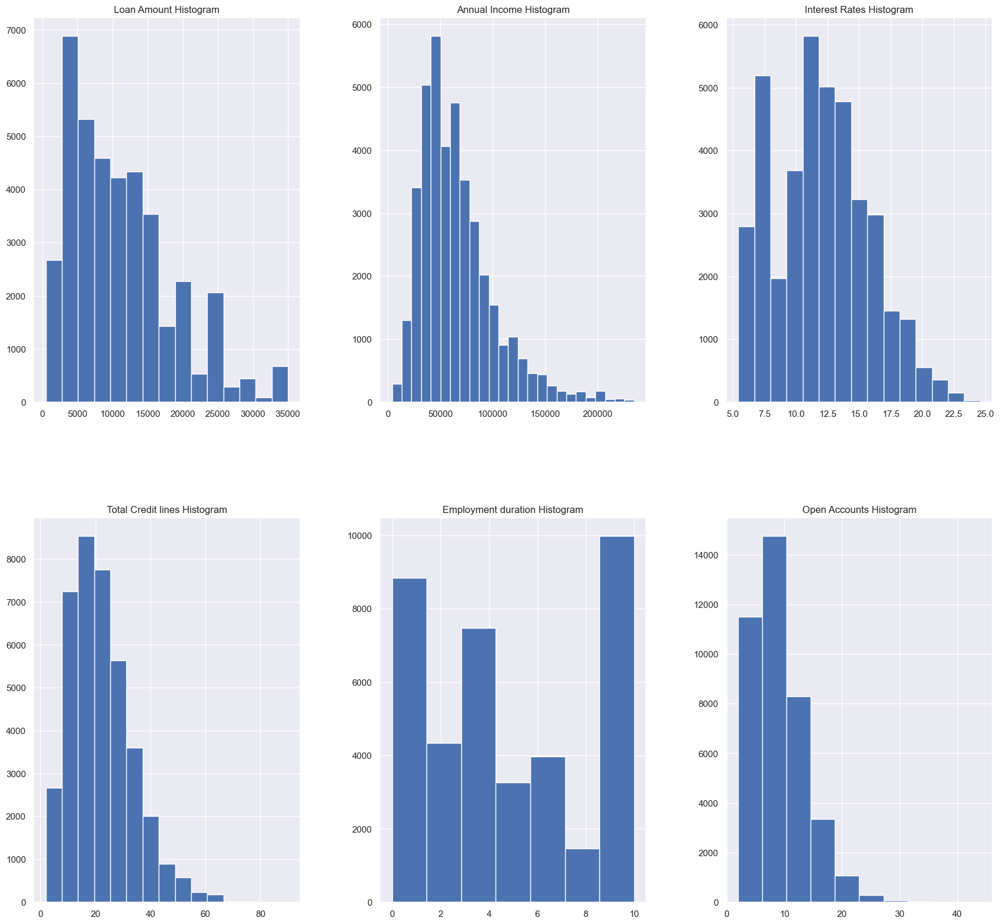

In [333]:
#Understading the histrogram of major quantifiable variables 

plt.subplot(2,3,1)

plt.hist(loan_cleaned4['loan_amnt'], bins = 15)
plt.title("Loan Amount Histogram")

plt.subplot(2,3,2)

plt.hist(loan_cleaned4['annual_inc'], bins = 25)
plt.title("Annual Income Histogram")

plt.subplot(2,3,3)

plt.hist(loan_cleaned4['int_rate'], bins = 15)
plt.title("Interest Rates Histogram")

plt.subplot(2,3,4)

plt.hist(loan_cleaned4['total_acc'], bins = 15)
plt.title("Total Credit lines Histogram")

plt.subplot(2,3,5)

plt.hist(loan_cleaned4['emp_length'], bins = 7)
plt.title("Employment duration Histogram")

plt.subplot(2,3,6)

plt.hist(loan_cleaned4['open_acc'], bins = 10)
plt.title("Open Accounts Histogram")

plt.subplots_adjust(top = 1.5, bottom=0, hspace=0.3, wspace=0.3, right = 1.75)
plt.show()


## Findings
# Loan Amount: Basis histogram in 1st chart, # accounts with loan amount peaks before 5k and concentrated between 5-15k
# Annual Income: Basis the histogram in the middle chart, Annual Income peaks at 50k
# Interest rates: Basis the histogram in the rightmost chart, Interest Rates seem to peak at 11-12% followed by 7%
# Credit Lines: Basis histogram in 1st chart, # accounts credit lines peaks within 15-20 and tapers down beyond 20
# Employment Duration: Basis the histogram in the middle chart, highest number of users lie in > 10 years exp range followed by 0-1 years of work exp.
# Open Accounts: Basis the histogram in the right-most chart, majority population seems to have 5-10 open accounts

### Correlation Matric for Quantitaive Variables

Text(0.5, 1.0, 'Correlation Matrix')

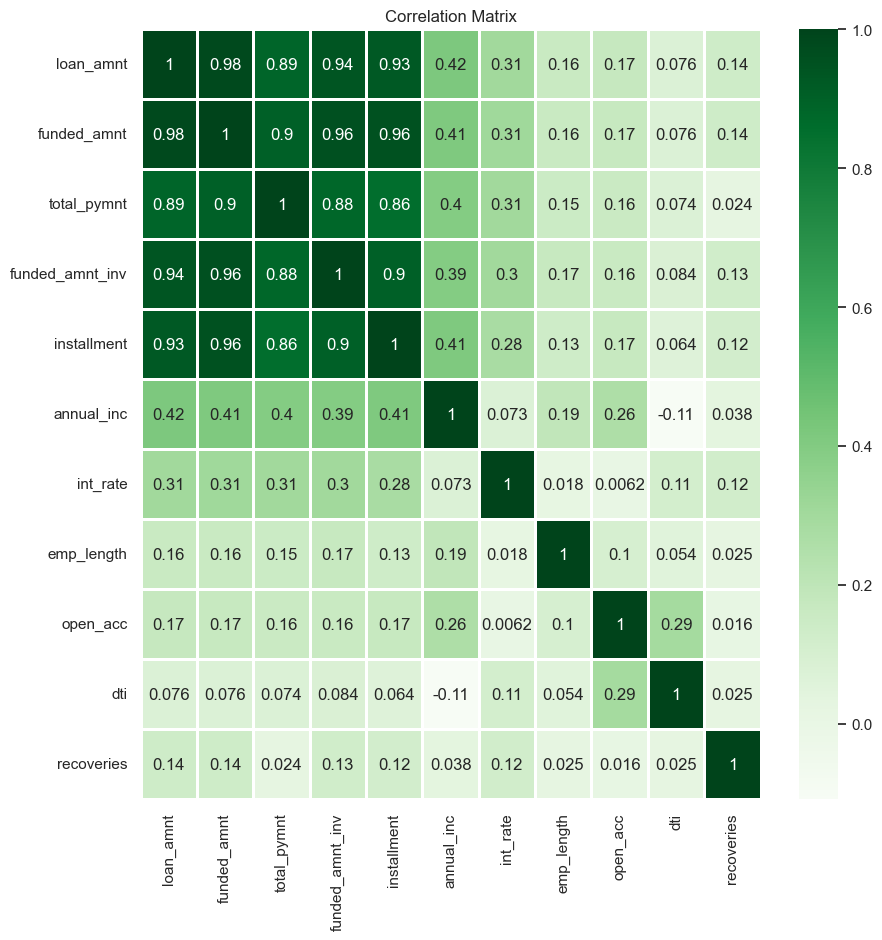

In [335]:
# Check correlation across the major quantitave variables
corr1 = loan_cleaned4[["loan_amnt","funded_amnt","total_pymnt","funded_amnt_inv","installment","annual_inc","int_rate","emp_length","open_acc","dti","recoveries"]]
sb.set (rc = {'figure.figsize':(10, 10)})
dataplot = sb.heatmap(corr1.corr(), cmap="Greens", annot=True, linewidths=.75)
plt.title('Correlation Matrix')

# There is high correlation observed between Loan amount, funded amount, Installment & investor funded amount
# Going forward we will be using only Loan Amount as it captures majority of variations across all the highly correlated metrics

### [EDA] Understanding Distribution of loan status across major categorical variables available

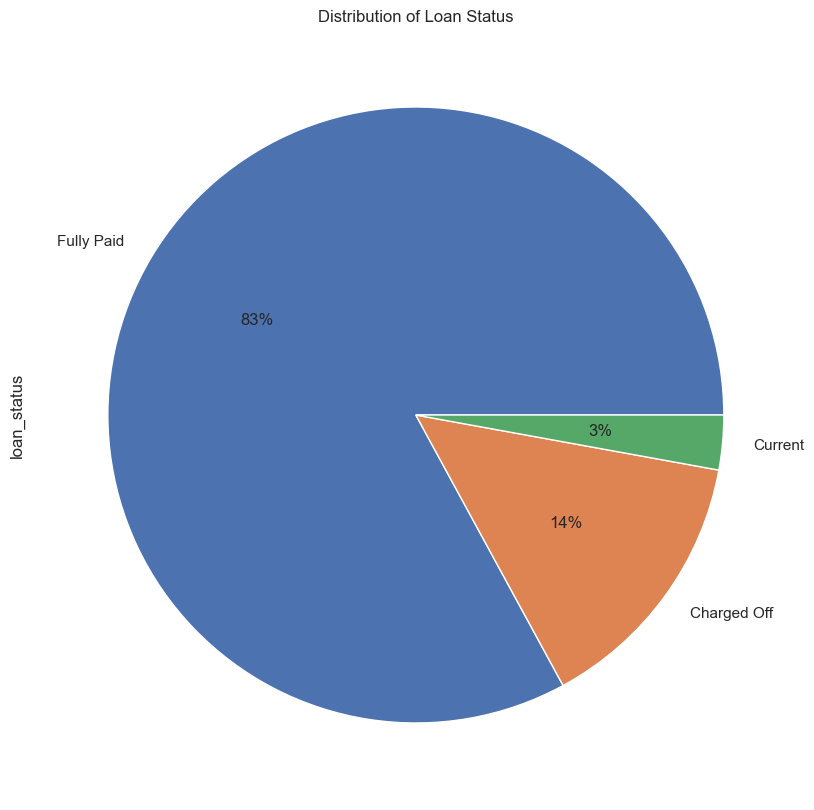

In [336]:
# Underatnding Distribution of loan status

loan_cleaned4.loan_status.value_counts().plot.pie(autopct='%.0f%%')
plt.title("Distribution of Loan Status")
plt.show()

# About 14% of the total Loans were charged off

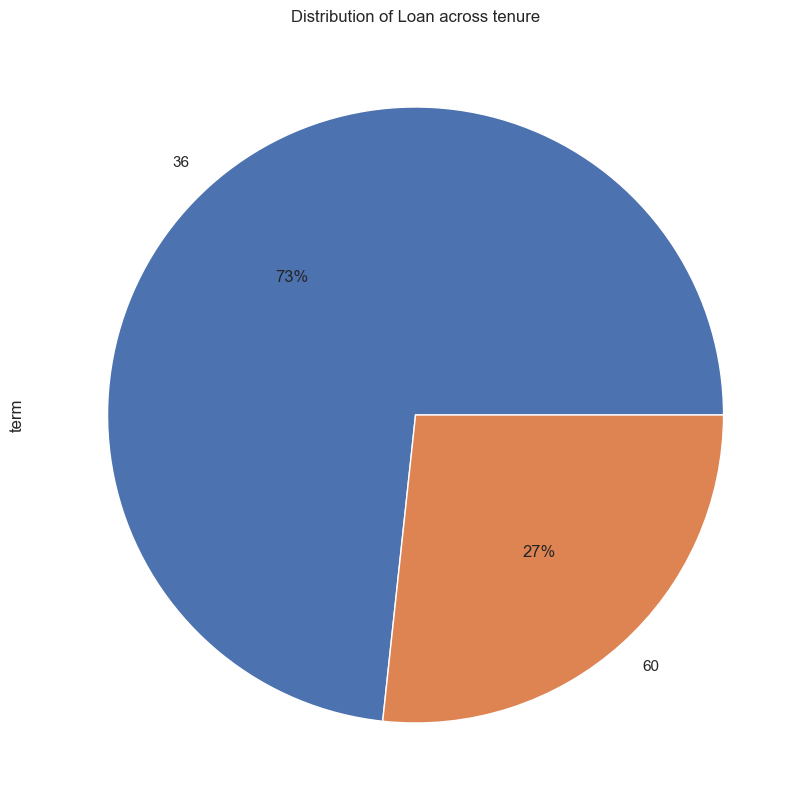

In [337]:
# Underatnding Distribution of loan across Tenure

loan_cleaned4.term.value_counts().plot.pie(autopct='%.0f%%')
plt.title("Distribution of Loan across tenure")
plt.show()

# About 73% of the total Loans were 36 months

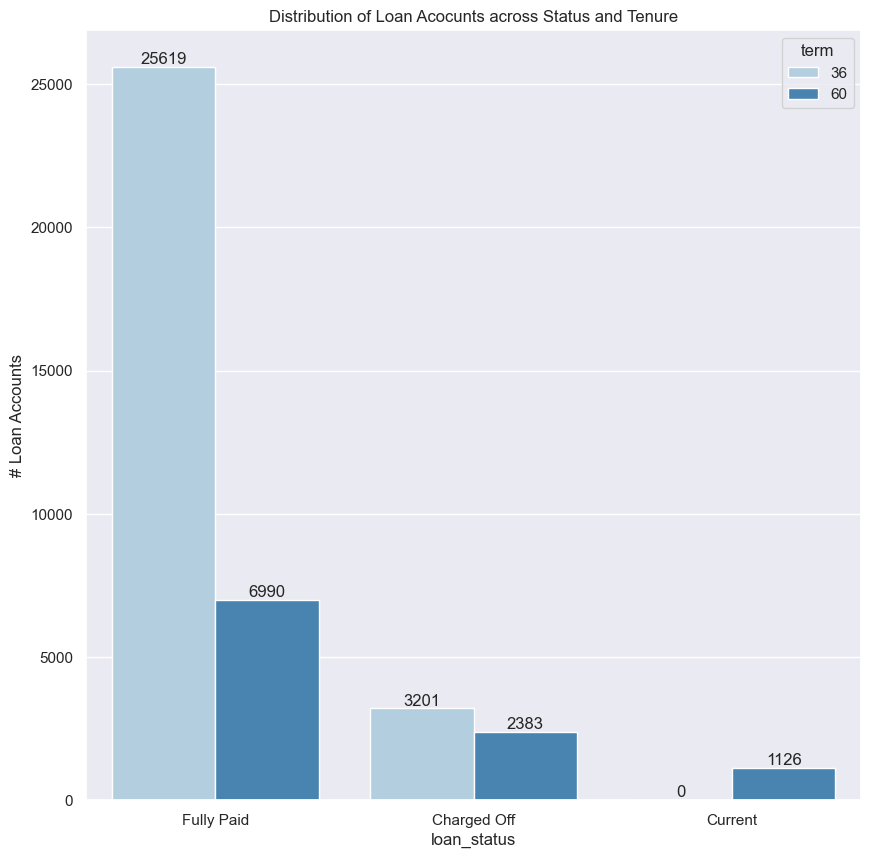

In [258]:
# Distribution of Loan accounts with Status acorss Tenure
sb1 = sb.countplot(x = 'loan_status', hue = 'term', data = loan_cleaned4, palette = "Blues")
for label in sb1.containers:
    sb1.bar_label(label)
sb1.set_title('Distribution of Loan Acocunts across Status and Tenure')
sb1.set_ylabel('# Loan Accounts')
plt.show()

# Findings - Higher Contribution of charged off loans is coming from 60 month tenure as compared to Fully Paid

In [259]:
# Distribution of Loan Accounts across Purpose
(loan_cleaned4.purpose.value_counts()*100)/len(loan_cleaned4)

# Debt Consolidation is the major purpose of Loans contributing to ~47% of total loans followed by credit card at ~13%

debt_consolidation    47.043414
credit_card           12.942852
other                 10.066380
home_improvement       7.360309
major_purchase         5.508787
small_business         4.570310
car                    3.921768
wedding                2.383072
medical                1.744704
moving                 1.467484
vacation               0.968997
house                  0.943564
educational            0.821486
renewable_energy       0.256873
Name: purpose, dtype: float64

#### [EDA] To understand Loan Distribution of Loans/Defaulters basis the Purpose of loan

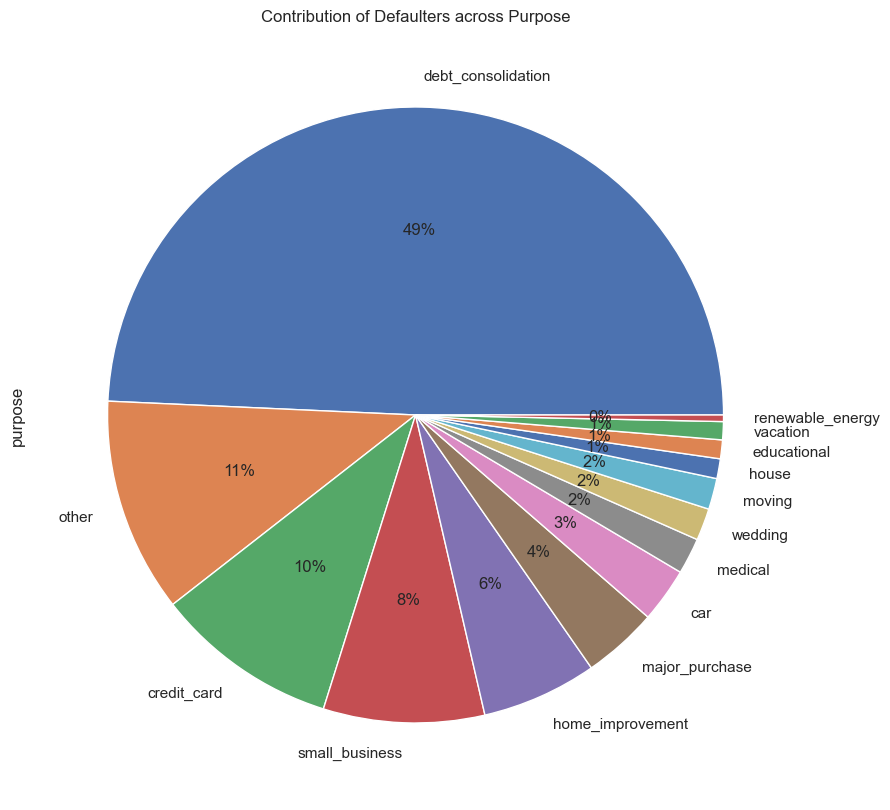

In [260]:
# Distribution of Defaulters across Purpose of Loan
subset1 = loan_cleaned4[loan_cleaned4['loan_status'] == 'Charged Off']

subset1.purpose.value_counts().plot.pie(autopct='%.0f%%')
plt.title("Contribution of Defaulters across Purpose")
plt.show()

# Finding - Major Loans are contributed under Debt Consolidation purpse (49%) followed by Credit card at 10%

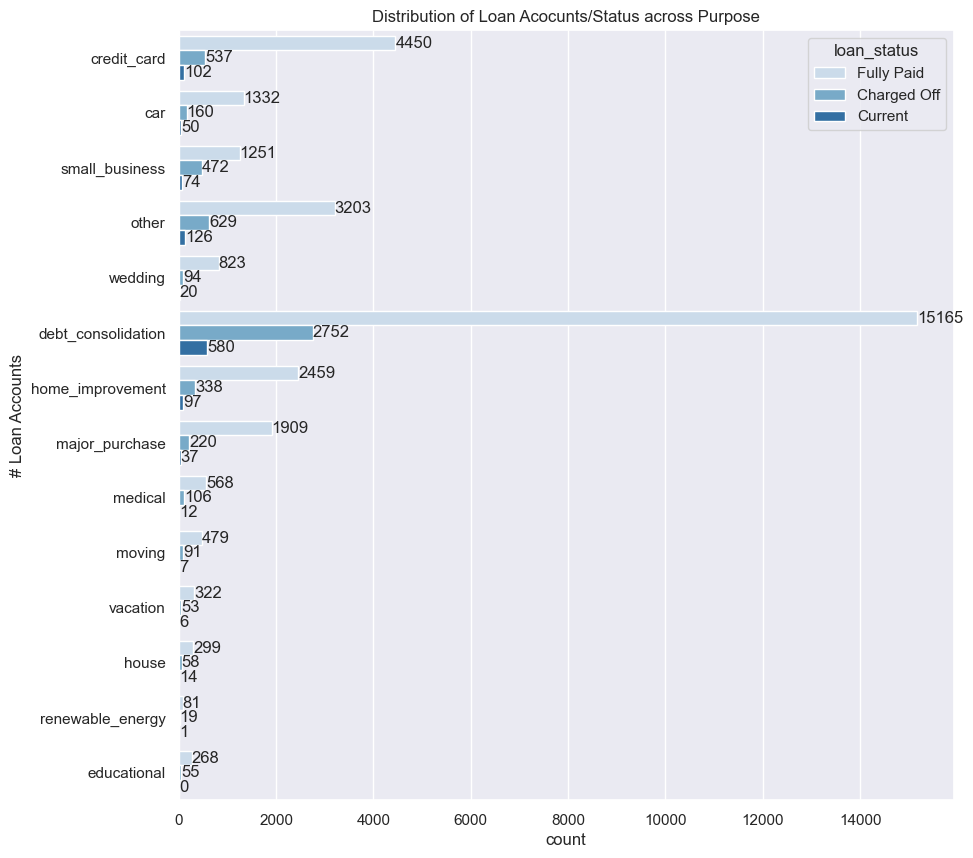

In [338]:
# Distribution of Loan accounts with Status acorss Tenure
sb2 = sb.countplot(y = 'purpose', hue = 'loan_status', data = loan_cleaned4, palette = "Blues")
for label in sb2.containers:
    sb2.bar_label(label)
sb2.set_title('Distribution of Loan Acocunts/Status across Purpose')
sb2.set_ylabel('# Loan Accounts')
plt.show()

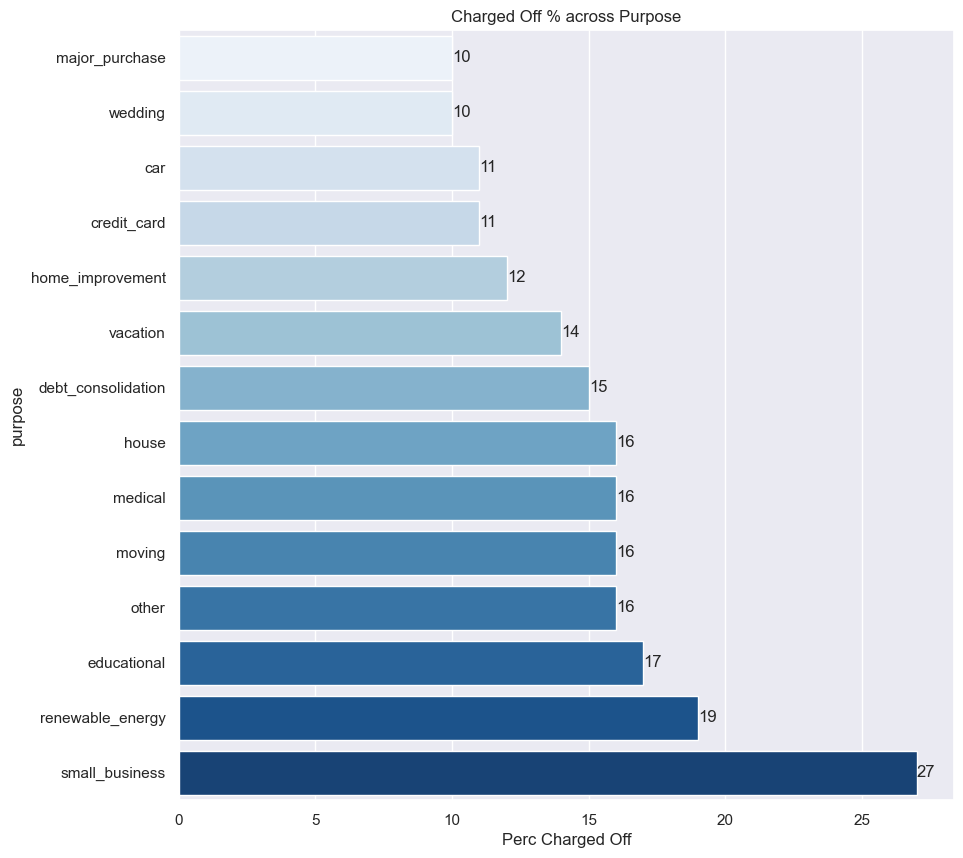

In [340]:
# Understand the Defauter distribution within each Purpose of Loan
# pivot1 = loan_cleaned4.pivot_table(values='id', index='purpose', columns=['loan_status'], aggfunc='count', fill_value=0, margins=True)
# pivot1['Perc Charged Off'] = (pivot1['Charged Off']*100/pivot1['All']).round()
# print(pivot1)

pivot1 = loan_cleaned4.pivot_table(values='id', index='purpose', columns=['loan_status'], aggfunc='count', fill_value=0, margins=True).reset_index()
# Calculating percentage Charged off as Charged Off and Fully paid as denominator
pivot1['Perc Charged Off'] = (pivot1['Charged Off']*100/(pivot1['Charged Off']+pivot1['Fully Paid'])).round()
# Remove the totals row for columns
pivot1 = pivot1.iloc[:-1]
#Selecting only year and calculated Percentage charged off columns
df1 = pivot1[['purpose','Perc Charged Off']]

# Plotting bar chart across years
df1 = df1.sort_values('Perc Charged Off')
sb1 = sb.barplot(y='purpose',x='Perc Charged Off', data=df1, palette = "Blues")
sb1.set_title('Charged Off % across Purpose')
for label in sb1.containers:
        sb1.bar_label(label)



# Out of the loans taken for the purpose of Small Business & Renewable Energy have the highest % of Defaulters, 26% and 19% respectively, compared to 14% at an overall level
# Highest quantum of defaulters lies in Debt Consolidation given the quantum of loans under this purpose is also significantly high

### Creating derived metric called Perc Charged off (defined as charged off loans % of loans charged off plus Fully paid loans. Also referred to as “Defaulter %”)

### Using For loop to iterate and create visualizations for Load accounts Distributions and % Charged Off Loans across below categorical avaiables - 
#### 1. Issue Year
#### 2. Loan Term
#### 3. Emp Length
#### 4. Home Ownership
#### 5. Verification Status
#### 6. # of Open Accounts
#### 7. Public Records of Discrepancies
#### 8. Public Record of Bankruptcies
#### 9. Grades
#### 10. Buckets of Loan Amount
#### 11.Buckets of Interest Rate
#### 12.Buckets of Annual Income

Trend Charts for issue_year


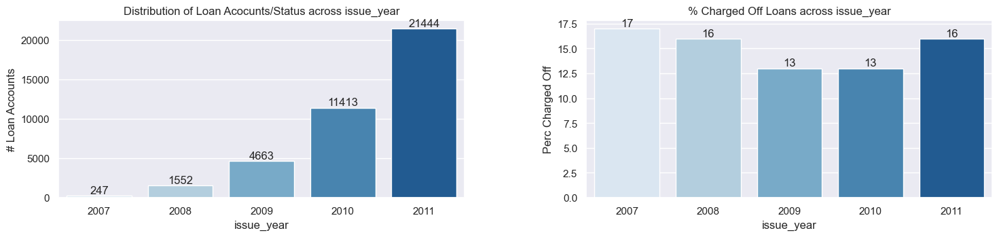

Trend Charts for term


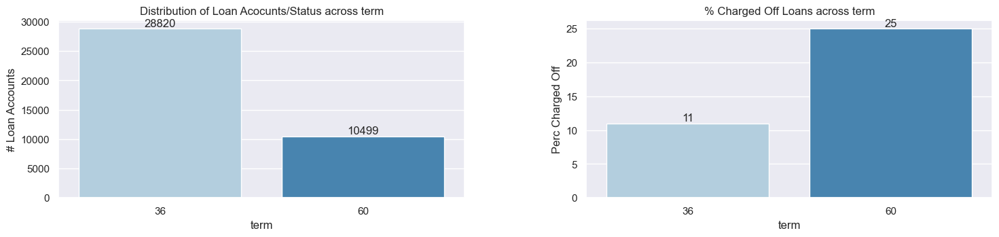

Trend Charts for emp_length


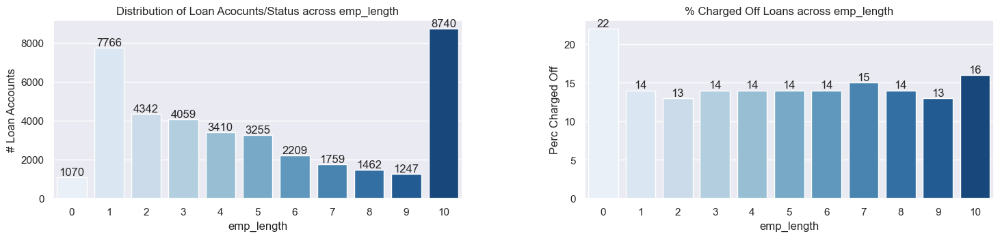

Trend Charts for home_ownership


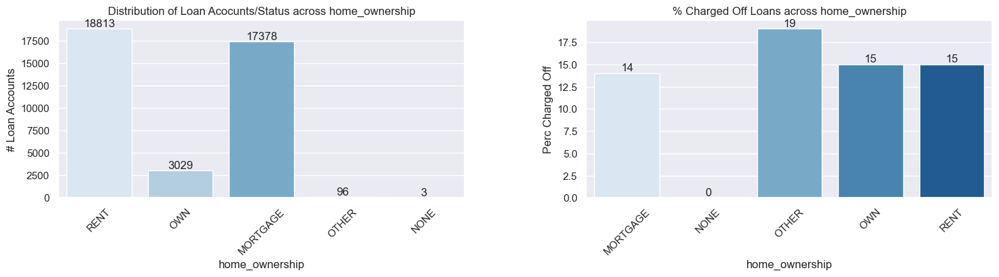

Trend Charts for verification_status


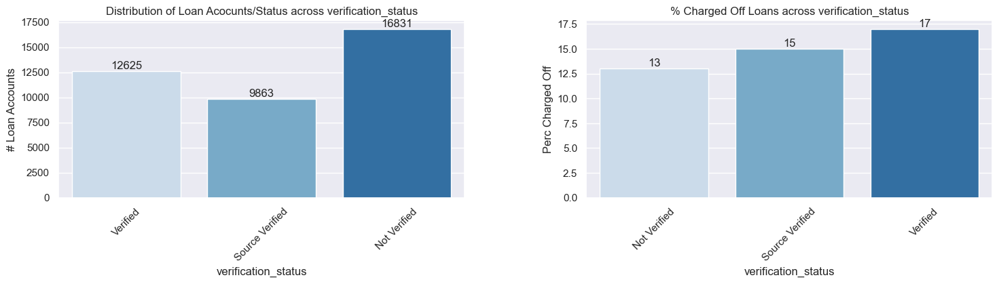

Trend Charts for bucket_open_acc


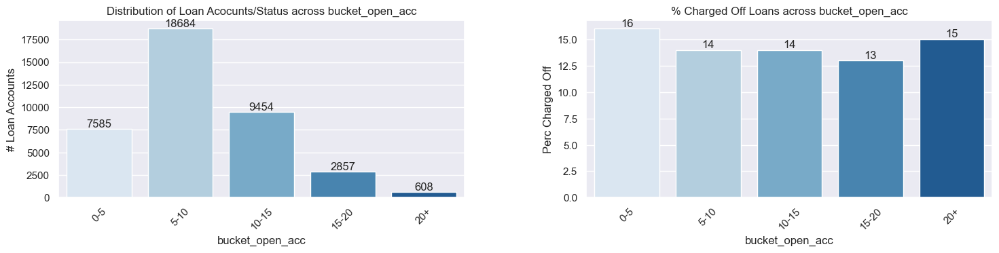

Trend Charts for pub_rec


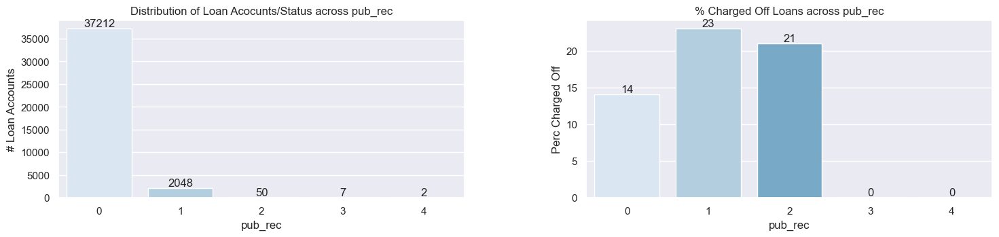

Trend Charts for pub_rec_bankruptcies


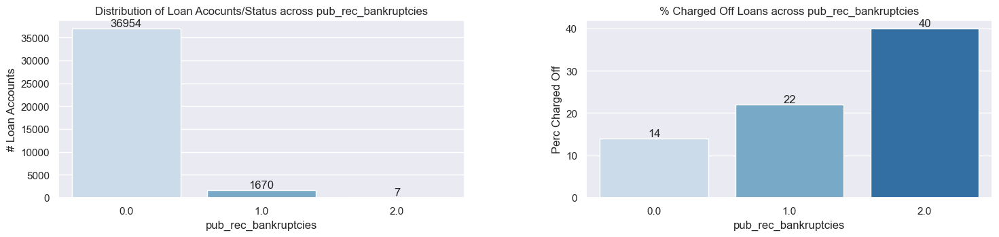

Trend Charts for grade


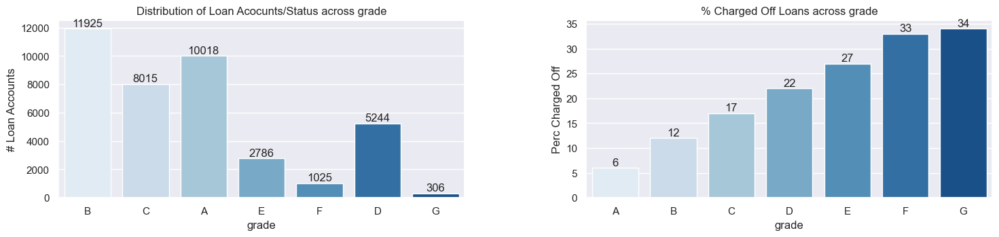

Trend Charts for bucket_loan_amnt


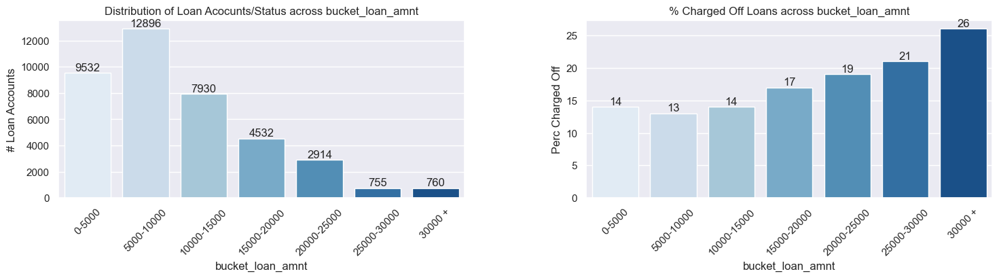

Trend Charts for bucket_int_rate


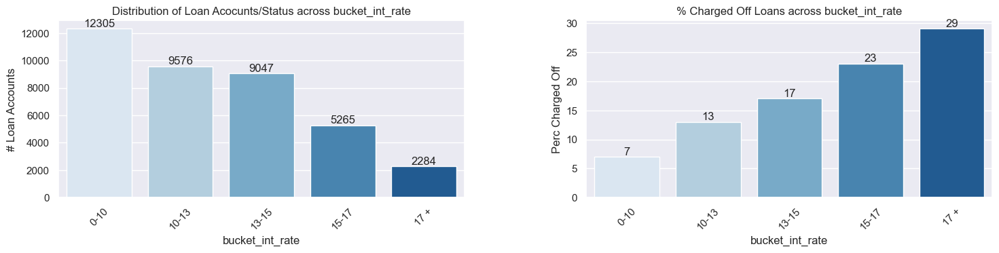

Trend Charts for bucket_annual_inc


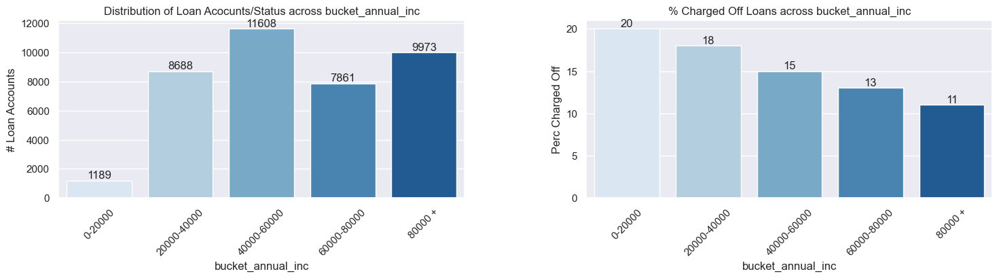

In [270]:
# CREATE A SUBSET OF DATASET FOR CREATING LOOPING OF CATEGIRICAL VARIABLE GRAPHS

loan_subset = loan_cleaned4[['id','issue_year','term','emp_length','home_ownership','verification_status','bucket_open_acc','pub_rec','pub_rec_bankruptcies','grade', 'bucket_loan_amnt','bucket_int_rate', 'bucket_annual_inc', 'loan_status']]
col_names = loan_subset.columns.values.tolist()
# Define Columns where X Axis values are not to be rotated
non_rotated = loan_subset[['issue_year','term','emp_length','pub_rec','pub_rec_bankruptcies','grade']].columns.values.tolist()

a = loan_subset.shape[1]-2
# No of graphs in each row
b = 2

for i in range(1,len(loan_subset.columns)-1):
    print('Trend Charts for '+ str(col_names[i]))

    plt.subplot(a,b,(i*b)-1)
        
    #sb2 = plt.pie(loan_subset, labels=col_names[i], colors='Blues', autopct='%.0f%%') 
    sb2 = sb.countplot(x = col_names[i], data = loan_cleaned4, palette = "Blues")
    for label in sb2.containers:
        sb2.bar_label(label)
    sb2.set_title('Distribution of Loan Acocunts/Status across ' + str(col_names[i]))
    sb2.set_ylabel('# Loan Accounts')
    if col_names[i] not in non_rotated:
        plt.xticks(rotation=45)
    
    plt.subplot(a,b,(i*b))
    
    pivot2 = loan_cleaned4.pivot_table(values=col_names[0], index=col_names[i], columns=['loan_status'], aggfunc='count', fill_value=0, margins=True).reset_index()
    # Calculating percentage Charged off as Charged Off and Fully paid as denominator
    pivot2['Perc Charged Off'] = (pivot2['Charged Off']*100/(pivot2['Charged Off']+pivot2['Fully Paid'])).round()
    # Remove the totals row for columns
    pivot2 = pivot2.iloc[:-1]
    #Selecting only Required Categorical Column and calculated Percentage charged off columns
    df2 = pivot2[[col_names[i],'Perc Charged Off']]
    
    # Plotting bar chart across years
    sb3 = sb.barplot(x=col_names[i],y='Perc Charged Off', data=df2, palette = "Blues")
    for label in sb3.containers:
        sb3.bar_label(label)
    sb3.set_title('% Charged Off Loans across ' + str(col_names[i]))
    if col_names[i] not in non_rotated:
        plt.xticks(rotation=45)

    
    plt.subplots_adjust(top = 4, bottom=0, hspace=0.3, wspace=0.3, right = 1.5)
    plt.show()

    
# Findings
# Years: There has been a gradual increase in Loans across the years 2007 to 2011. There is no specific trend in % defaulters across years
# Employment Years: Major portion of the loan account holder sare either > 10 years experienced or with <= 1 yr experience. < 1 yr experience acc holders have highest Defaulter %. There is no trend beyond that
# Verification Status: About 43% of loans are contributed by Non verified users. Surprisingly, non-verified users have the lowest defaulter rates at 13% compared to verified users at 17%
# Hoem Ownership: Mortgage and Rent users contribute to the majority loan users. Even with only 96 loan accounts from others section, Defaulter % is highest at 19%
# Interest Rate: There is a steep increase in Defaulter % as the interest rate increases with ~29% for > 17% interest rate bucket
# Income Bucket: There is no trends in # of loans based on Income buckets. However, there is a stark declining trend in Defaulter % as income buckets move higher (highest at 20% in the < 20k bucket)
# Grades: There is a steep increase in Defaulter % at higher Grades (E, F, G) at 27%, 33% and 34% respectively
# Bankruptcies: While the # of loans for users with >= 1 bankruptcies is minimal, the default rates are as high as 40% for users with 2 records

### Bivariate Analysis

In [287]:
# Term of Loan vs Interest Rate
fig4 = px.box(loan_cleaned4, y='int_rate', x='term', color = 'loan_status',
              labels={
                     "int_rate": "Interest Rate (%)",
                     "term": "Loan Tenure"
              },
                  title='Term of loan vs Interest Rate'
                  )
fig4.show()

# Findings
# Interest Rates are significantly higher for 60 months loan tenure compared to 36 month tenure (median at 14.79% and 11% respectively)
# Within 60 months tenure as well the Defaulter's median IR is at 16% compared to 14.7% for Fully Paid ones

In [290]:
# Grades vs Interest Rate
fig5 = px.box(loan_cleaned4, y='int_rate', x='grade', color = 'loan_status',
              labels={
                     "int_rate": "Interest Rate (%)",
                     "grade": "Grades"
              },
                  title='Grades vs Interest Rate'
                  )
fig5.update_xaxes(categoryorder='category ascending')
fig5.show()
# Findings
# There is a clear Trend of Increase in IR as one moves from Grade A to Grade G
# Interestingly, it is observed that the loans with Status as current have the highest Interest Rates within Each bucket

In [292]:
# Bucket of Loan Amounts vs Interest Rate
fig5 = px.box(loan_cleaned4, y='int_rate', x='bucket_loan_amnt',
              labels={
                     "int_rate": "Interest Rate (%)",
                     "bucket_loan_amnt": "Loan Amount"
              },
                  title='Loan Amount vs Interest Rate'
                  )
#fig5.update_xaxes(categoryorder='category ascending')
fig5.show()

# Findings
# As the loan amount increases the Interest Rate sees an increasing trend

### Multivariate Analysis using Scatter plot

In [342]:
# Scatter plot to understand trends between Loan Status by Interest rates and Loan Amount
loan_cleaned5 = loan_cleaned4[loan_cleaned4['loan_status'] != 'Current']
fig6 = px.scatter(loan_cleaned5, x='loan_amnt', y='int_rate',
              color='loan_status', title='Scatter Plot for Loan Status across Interest rates and Loan Amount')
fig6.show()

# Findings
# There is high consolidation of Charged Off loans at lower Loan Amount and higher Interest rates

In [343]:
# Scatter plot to understand trends between Loan Status by Annual Income and Loan Amount
loan_cleaned5 = loan_cleaned4[loan_cleaned4['loan_status'] != 'Current']
fig6 = px.scatter(loan_cleaned5, x='loan_amnt', y='annual_inc',
              color='loan_status', title='Scatter Plot for Loan Status across Annual Income and Loan Amount')
fig6.show()

# Findings
# There is an increase in bottom limit of loan amount with increasing annual income
# There is high consolidation of Charged Off loans at low annual income and lower loan amount